<a href="https://colab.research.google.com/github/Tommy840602/OpenCV/blob/main/background_removal_plant_pathology.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
import numpy as np
import pandas as pd
import cv2
from tqdm import tqdm
tqdm.pandas()
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
!unzip plant-pathology-2020-fgvc7.zip

Archive:  plant-pathology-2020-fgvc7.zip
  inflating: images/Test_0.jpg       
  inflating: images/Test_1.jpg       
  inflating: images/Test_10.jpg      
  inflating: images/Test_100.jpg     
  inflating: images/Test_1000.jpg    
  inflating: images/Test_1001.jpg    
  inflating: images/Test_1002.jpg    
  inflating: images/Test_1003.jpg    
  inflating: images/Test_1004.jpg    
  inflating: images/Test_1005.jpg    
  inflating: images/Test_1006.jpg    
  inflating: images/Test_1007.jpg    
  inflating: images/Test_1008.jpg    
  inflating: images/Test_1009.jpg    
  inflating: images/Test_101.jpg     
  inflating: images/Test_1010.jpg    
  inflating: images/Test_1011.jpg    
  inflating: images/Test_1012.jpg    
  inflating: images/Test_1013.jpg    
  inflating: images/Test_1014.jpg    
  inflating: images/Test_1015.jpg    
  inflating: images/Test_1016.jpg    
  inflating: images/Test_1017.jpg    
  inflating: images/Test_1018.jpg    
  inflating: images/Test_1019.jpg    
  inflati

In [9]:
IMAGE_PATH = "/content/images/"
sub = pd.read_csv("/content/sample_submission.csv")
test = pd.read_csv("/content/test.csv")
train = pd.read_csv("/content/train.csv")

In [10]:
def load_image(image_id):
    filename = image_id +".jpg"
    image = cv2.imread(IMAGE_PATH+filename)
    return cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

train_images = train["image_id"].sample(100, random_state=2020).progress_apply(load_image)

100%|██████████| 100/100 [00:04<00:00, 23.08it/s]


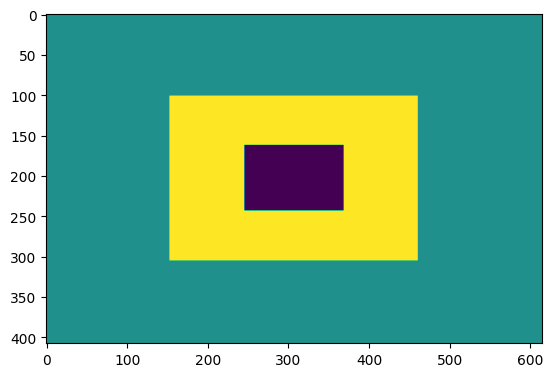

In [11]:
def init_grabcut_mask(h, w):
    mask = np.ones((h, w), np.uint8) * cv2.GC_PR_BGD
    mask[h//4:3*h//4, w//4:3*w//4] = cv2.GC_PR_FGD
    mask[2*h//5:3*h//5, 2*w//5:3*w//5] = cv2.GC_FGD
    return mask

plt.imshow(init_grabcut_mask(3*136, 3*205))

In [12]:
def add_contours(image, mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    if len(contours) != 0:
        cv2.drawContours(image, contours, -1, (255, 0, 0), 3)
        c = max(contours, key = cv2.contourArea)
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0) ,2)

In [13]:
def remove_background(image):
    h, w = image.shape[:2]
    mask = init_grabcut_mask(h, w)
    bgm = np.zeros((1, 65), np.float64)
    fgm = np.zeros((1, 65), np.float64)
    cv2.grabCut(image, mask, None, bgm, fgm, 1, cv2.GC_INIT_WITH_MASK)
    mask_binary = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
    result = cv2.bitwise_and(image, image, mask = mask_binary)
    add_contours(result, mask_binary) # optional, adds visualizations
    return result

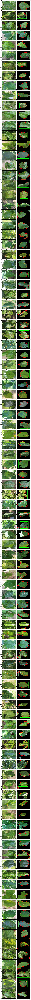

In [14]:
rows, cols = (len(train_images), 2)
axes_pad = 0.2
fig_h = 4.0 * rows + axes_pad * (rows-1)
fig_w = 4.0 * cols + axes_pad * (cols-1)
fig = plt.figure(figsize=(fig_w, fig_h))
grid = ImageGrid(fig, 111, nrows_ncols=(rows, cols), axes_pad=0.2)

for i, ax in enumerate(grid):
    im = cv2.resize(train_images.iloc[i // 2], (3*205, 3*136))
    if i % 2 == 1:
        im = remove_background(im)
    ax.imshow(im)